# Text-Based Image Editing with Three Models
In this notebook I try to use the strengths of three models (SAM, Stable Diffusion, and Grounding DINO) to edit and manipulate images.The process starts by installing the necessary libraries and models. I begin with SAM, a powerful segmentation model, Stable Diffusion for image inpainting, and GroundingDINO for image captioning to implement complex image transformations.





## Install and Initialize Libraries

In [ ]:
# ----install SAM, Stable Diffusion and libraries
!pip -q install diffusers transformers scipy segment_anything
# ------install GroundingDINO, DINO weights
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO
!pip -q install -e .
%mkdir weights
%cd weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth
%cd ..

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 70.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 55.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 64.2 MB/s eta 0:00:00
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (76/76), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 401 (delta 51), reused 44 (delta 44), pack-reused 325
Receiving objects: 100% (401/401), 12.84 MiB | 30.38 MiB/s, done.
Resolving deltas: 100% (204/204), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 4.0

In [ ]:
# ----SAM
from segment_anything import SamPredictor, sam_model_registry
# ----Stable Diffusion
from diffusers import StableDiffusionInpaintPipeline
# ----GroundingDINO
from groundingdino.util.inference import load_model, load_image, predict, annotate
from GroundingDINO.groundingdino.util import box_ops
# ----Extra Libraries
from PIL import Image
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

## Set Parameters

In [ ]:
# -----Set Image and CUDA
device = "cuda"
img_path = '/cars.jpg'
src, img = load_image(img_path)
# ------SAM Parameters
model_type = "vit_h"
predictor = SamPredictor(sam_model_registry[model_type](checkpoint="./weights/sam_vit_h_4b8939.pth").to(device=device))
# ------Stable Diffusion
pipe = StableDiffusionInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-2-inpainting", torch_dtype=torch.float16,).to(device)
# ----Grounding DINO
groundingdino_model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# ---- prompt is for identifying target object in the image
TEXT_PROMPT = "car"
BOX_TRESHOLD = 0.3
TEXT_TRESHOLD = 0.25

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


## Utill Functions

In [ ]:
def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

## Main Code

    """
    Makes predictions using GroundingDINO model.

    Parameters:
    - model: Pre-trained model for prediction.
    - image (torch.Tensor): Image tensor for prediction.
    - caption (str): Text prompt for prediction.
    - box_threshold (float): Threshold for bounding boxes.
    - text_threshold (float): Threshold for phrases.
    - remove_combined (bool, optional): Flag to remove combined phrases.

    Returns:
    - boxes (torch.Tensor): Predicted bounding boxes.
    - logits (torch.Tensor): Confidence for each phrase.
    - phrases (List[str]): Predicted phrases.
    """


In [ ]:
boxes, logits, phrases = predict(
    model=groundingdino_model,
    image=img,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)
img_annnotated = annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:909: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


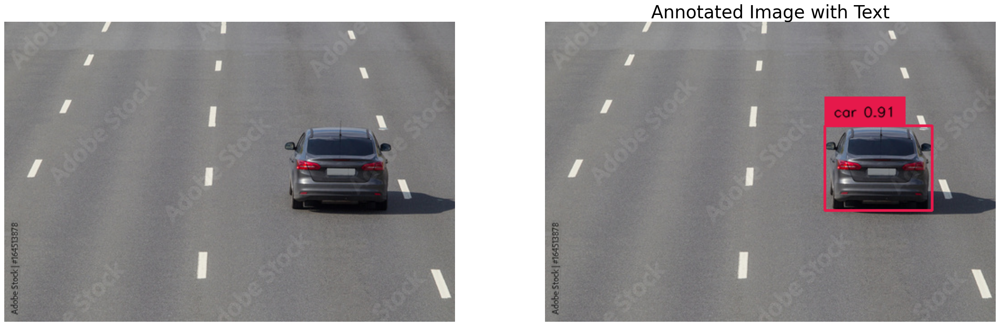

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Annotated Image with Text", fontsize=30)
axes[0].imshow(src)
axes[0].axis('off')
axes[1].imshow(img_annnotated)
axes[1].axis('off')

plt.show()

## Get Masks from Bounding Box using SAM

In [ ]:
predictor.set_image(src)
H, W, _ = src.shape
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
new_boxes = predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

    """
    Generates masks from prompts on the set image.

    Parameters:
    - point_coords (Optional[torch.Tensor]): Point prompts in pixels.
    - point_labels (Optional[torch.Tensor]): Labels for points (1: foreground, 0: background).
    - boxes (Optional[np.ndarray]): Box prompts in XYXY format.
    - mask_input (np.ndarray): Previous mask input.
    - multimask_output (bool): Returns multiple masks for ambiguous prompts.
    - return_logits (bool): Returns mask logits instead of binary masks.

    Returns:
    - masks (torch.Tensor): Output masks in BxCxHxW format.
    - qualities (torch.Tensor): Quality predictions for each mask.
    - logits (torch.Tensor): Low-res logits for next iteration.
    """


In [ ]:
masks, _, _ = predictor.predict_torch(
            point_coords = None,
            point_labels = None,
            boxes = new_boxes,
            multimask_output = False,
        )

In [ ]:
img_annotated_mask = Image.fromarray(show_mask(masks[0][0].cpu(), img_annnotated))
original_img = Image.fromarray(src).resize((512, 512))
img_annotated = Image.fromarray(img_annnotated)
only_mask = Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))

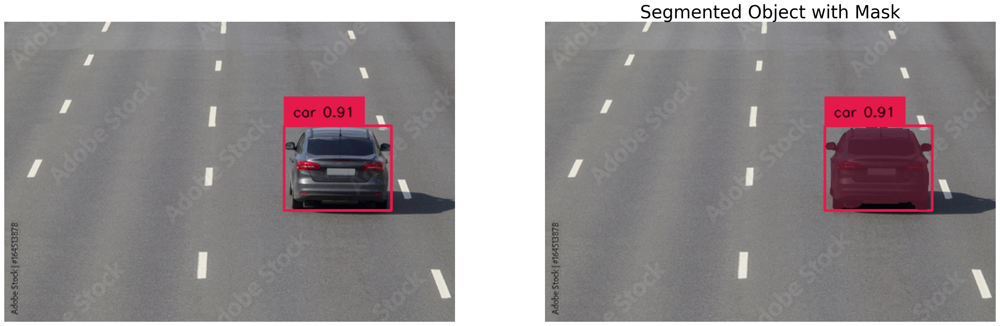

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Segmented Object with Mask", fontsize=30)
axes[0].imshow(img_annnotated)
axes[0].axis('off')
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
plt.show()

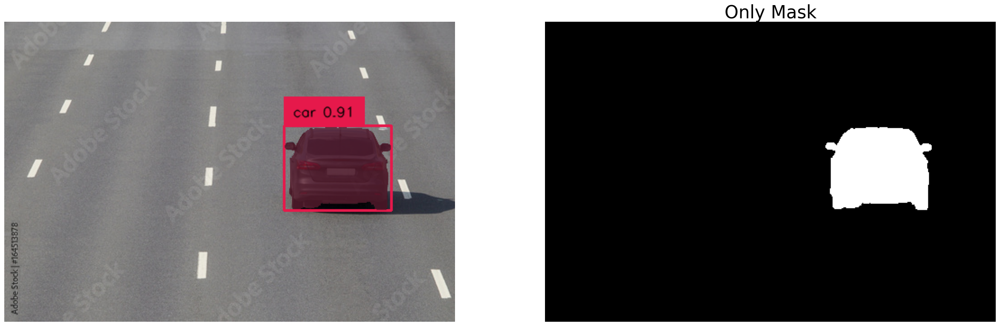

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Only Mask", fontsize=30)
axes[0].imshow(img_annotated_mask)
axes[0].axis('off')
axes[1].imshow(Image.fromarray(masks[0][0].cpu().numpy()))
axes[1].axis('off')

plt.show()

## Target Object to Replace with Text

In [ ]:
prompt = "Red Truck" #replace with this object
edited = pipe(prompt=prompt, image=original_img, mask_image=only_mask).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

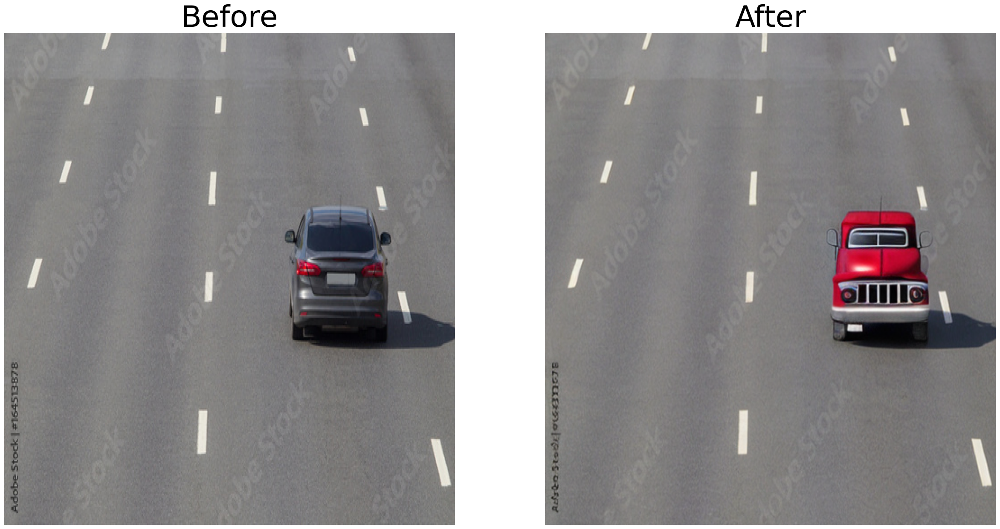

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(src)
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')
axes[1].imshow(edited)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()


# Conclusion

## Full Combined Code

In [ ]:
def process_boxes(boxes, src):
    H, W, _ = src.shape
    boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
    return predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

def edit_image(path, item, prompt, box_threshold, text_threshold):

    src, img = load_image(path)
    boxes, logits, phrases = predict(
        model=groundingdino_model,
        image=img,
        caption=item,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )
    predictor.set_image(src)
    new_boxes = process_boxes(boxes, src)
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=new_boxes,
        multimask_output=False,
    )
    img_annotated_mask = show_mask(masks[0][0].cpu(),
        annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]
    )
    return pipe(prompt=prompt,
        image=Image.fromarray(src).resize((512, 512)),
        mask_image=Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))
    ).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

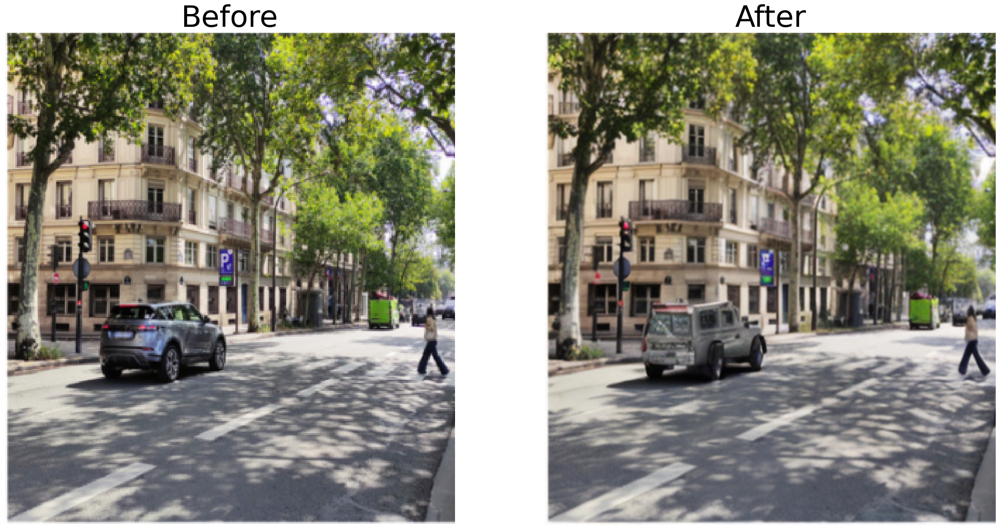

In [ ]:
path = '/street.png'
edited_image = edit_image(path, "car", "a big car", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()


len 2


  0%|          | 0/50 [00:00<?, ?it/s]

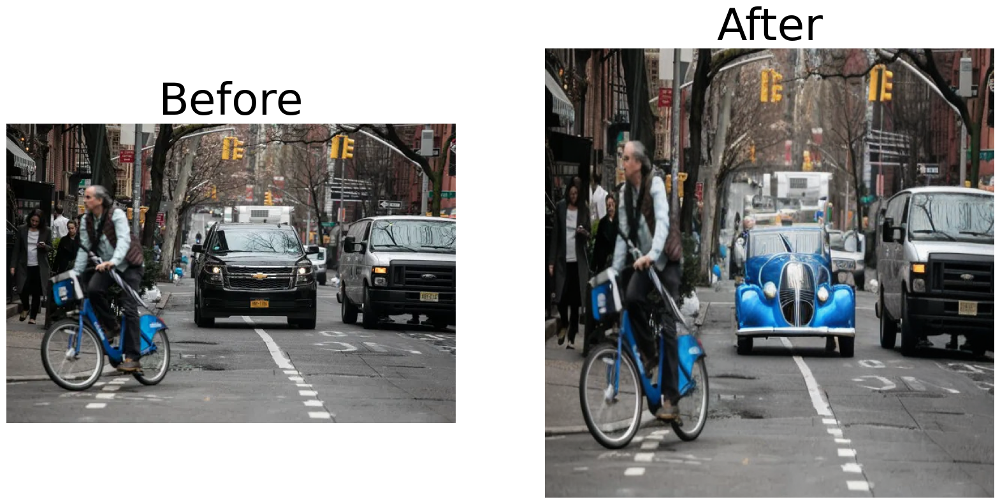

In [ ]:
path = './test3.jpg'
edited_image = edit_image(path, "car", "blue car", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(20, 20))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()
